# EYE FOR BLIND

This notebook will be used to prepare the capstone project 'Eye for Blind'

## Problem Statement

In this capstone project, you need to create a deep learning model which can explain the contents of an image in the form of speech through caption generation with an attention mechanism on Flickr8K dataset. This kind of model is a use-case for blind people so that they can understand any image with the help of speech. The caption generated through a **CNN-RNN model** will be converted to speech using a text to speech library.  

This problem statement is an application of both deep learning and natural language processing. The features of an image will be extracted by a CNN-based encoder and this will be decoded by an RNN model.

**The project is an extended application of `Show, Attend and Tell: Neural Image Caption Generation with Visual Attention paper`.** 

The dataset is taken from the Kaggle website and it consists of sentence-based image descriptions having a list of 8,000 images that are each paired with five different captions which provide clear descriptions of the salient entities and events of the image.

### The major steps that have to perform can be briefly summarised in the following four steps:

**1) Data Understanding:-** Here, load the data and understand the representation.

**2) Data Preprocessing:-** In this step, process both images and captions to the desired format.

**3) Train-Test Split:-** Combine both images and captions to create the train and test dataset.

**4) Model Building:-** This is the stage where we will create our image captioning model by building Encoder, Attention and Decoder model.

**5) Model Evaluation:-** Evaluate the models using greedy search and BLEU score.

In [1]:
pip install gTTS

Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.



In [2]:
pip install wordcloud

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install playsound

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [4]:
#Import all the required libraries

import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import os

from skimage import io
pd.set_option('display.max_colwidth', None)

import collections
from wordcloud import WordCloud, STOPWORDS

import tensorflow as tf
import keras
from keras.preprocessing.image import load_img
import string
import time
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer

from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from tensorflow.keras import activations
from tensorflow.keras import Input
from tqdm import tqdm
from PIL import Image

from gtts import gTTS
from playsound import playsound
from IPython import display



Let's read the dataset

## [1] Data understanding
1.Import the dataset and read image & captions into two seperate variables

2.Visualise both the images & text present in the dataset

3.Create a dataframe which summarizes the image, path & captions as a dataframe

4.Create a list which contains all the captions & path

5.Visualise the top 30 occuring words in the captions



In [5]:
#Import the dataset and read the image into a seperate variable

images='./Images'

all_imgs = glob.glob(images + '/*.jpg',recursive=True)
print("The total images present in the dataset: {}".format(len(all_imgs)))

The total images present in the dataset: 8091


In [6]:
all_imgs

['./Images\\1000268201_693b08cb0e.jpg',
 './Images\\1001773457_577c3a7d70.jpg',
 './Images\\1002674143_1b742ab4b8.jpg',
 './Images\\1003163366_44323f5815.jpg',
 './Images\\1007129816_e794419615.jpg',
 './Images\\1007320043_627395c3d8.jpg',
 './Images\\1009434119_febe49276a.jpg',
 './Images\\1012212859_01547e3f17.jpg',
 './Images\\1015118661_980735411b.jpg',
 './Images\\1015584366_dfcec3c85a.jpg',
 './Images\\101654506_8eb26cfb60.jpg',
 './Images\\101669240_b2d3e7f17b.jpg',
 './Images\\1016887272_03199f49c4.jpg',
 './Images\\1019077836_6fc9b15408.jpg',
 './Images\\1019604187_d087bf9a5f.jpg',
 './Images\\1020651753_06077ec457.jpg',
 './Images\\1022454332_6af2c1449a.jpg',
 './Images\\1022454428_b6b660a67b.jpg',
 './Images\\1022975728_75515238d8.jpg',
 './Images\\102351840_323e3de834.jpg',
 './Images\\1024138940_f1fefbdce1.jpg',
 './Images\\102455176_5f8ead62d5.jpg',
 './Images\\1026685415_0431cbf574.jpg',
 './Images\\1028205764_7e8df9a2ea.jpg',
 './Images\\1030985833_b0902ea560.jpg',
 './

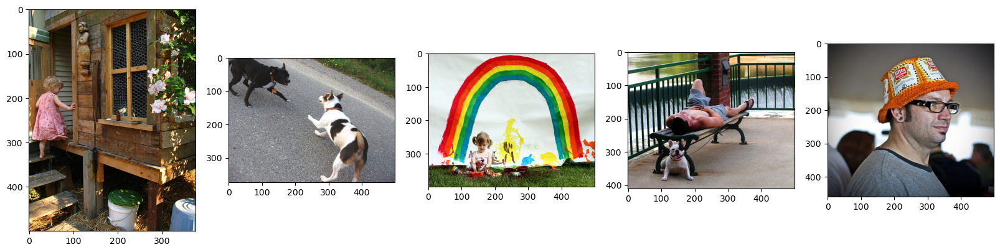

In [7]:
#Visualise both the images & text present in the dataset
Display_Images = all_imgs[0:5]
figure, axes = plt.subplots(1,5)
figure.set_figwidth(20)

for ax, image in zip(axes, Display_Images):
    ax.imshow(io.imread(image), cmap=None)


In [8]:
#Import the dataset and read the text file into a seperate variable

text_file = './captions.txt' #storing captions in a separate variable

def load_doc(text_file):
    
    open_file = open(text_file, 'r', encoding='latin-1')
    text = open_file.read()
    open_file.close()
    
    return text

doc = load_doc(text_file)
print(doc[:300])

image,caption
1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg,A girl going into a wooden building .
1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg,A little girl climbing


Create a dataframe which summarizes the image, path & captions as a dataframe

Each image id has 5 captions associated with it therefore the total dataset should have 40455 samples.

In [9]:
image_path = './Images/'

all_img_id= [] #store all the image id here
all_img_vector= [] #store all the image path here
annotations= [] #store all the captions here

with open('./captions.txt','r') as fo:
    next(fo) # to skip the heading
    for line in fo:
        split_arr = line.split(',')
        all_img_id.append(split_arr[0])
        annotations.append(split_arr[1].rstrip('\n.'))
        all_img_vector.append(image_path+split_arr[0])
    
df = pd.DataFrame(list(zip(all_img_id, all_img_vector,annotations)),columns =['ID','Path', 'Captions']) 
    
df.head


<bound method NDFrame.head of                               ID                                Path  \
0      1000268201_693b08cb0e.jpg  ./Images/1000268201_693b08cb0e.jpg   
1      1000268201_693b08cb0e.jpg  ./Images/1000268201_693b08cb0e.jpg   
2      1000268201_693b08cb0e.jpg  ./Images/1000268201_693b08cb0e.jpg   
3      1000268201_693b08cb0e.jpg  ./Images/1000268201_693b08cb0e.jpg   
4      1000268201_693b08cb0e.jpg  ./Images/1000268201_693b08cb0e.jpg   
...                          ...                                 ...   
40450   997722733_0cb5439472.jpg   ./Images/997722733_0cb5439472.jpg   
40451   997722733_0cb5439472.jpg   ./Images/997722733_0cb5439472.jpg   
40452   997722733_0cb5439472.jpg   ./Images/997722733_0cb5439472.jpg   
40453   997722733_0cb5439472.jpg   ./Images/997722733_0cb5439472.jpg   
40454   997722733_0cb5439472.jpg   ./Images/997722733_0cb5439472.jpg   

                                                                         Captions  
0         A child in 

In [10]:
len(annotations)

40455

In [11]:
type(annotations)

list

In [12]:
vocabulary = [ word for line in annotations for word in line.split() ]
vocabulary

['A',
 'child',
 'in',
 'a',
 'pink',
 'dress',
 'is',
 'climbing',
 'up',
 'a',
 'set',
 'of',
 'stairs',
 'in',
 'an',
 'entry',
 'way',
 'A',
 'girl',
 'going',
 'into',
 'a',
 'wooden',
 'building',
 'A',
 'little',
 'girl',
 'climbing',
 'into',
 'a',
 'wooden',
 'playhouse',
 'A',
 'little',
 'girl',
 'climbing',
 'the',
 'stairs',
 'to',
 'her',
 'playhouse',
 'A',
 'little',
 'girl',
 'in',
 'a',
 'pink',
 'dress',
 'going',
 'into',
 'a',
 'wooden',
 'cabin',
 'A',
 'black',
 'dog',
 'and',
 'a',
 'spotted',
 'dog',
 'are',
 'fighting',
 'A',
 'black',
 'dog',
 'and',
 'a',
 'tri-colored',
 'dog',
 'playing',
 'with',
 'each',
 'other',
 'on',
 'the',
 'road',
 'A',
 'black',
 'dog',
 'and',
 'a',
 'white',
 'dog',
 'with',
 'brown',
 'spots',
 'are',
 'staring',
 'at',
 'each',
 'other',
 'in',
 'the',
 'street',
 'Two',
 'dogs',
 'of',
 'different',
 'breeds',
 'looking',
 'at',
 'each',
 'other',
 'on',
 'the',
 'road',
 'Two',
 'dogs',
 'on',
 'pavement',
 'moving',
 'towa

#### Observation :-
We can see that we had both A and a are counted separately. So let's convert all words to lower case.

In [13]:
#Create the vocabulary & the counter for the captions

vocabulary = [ word.lower() for line in annotations for word in line.split() ]

val_count = collections.Counter(vocabulary)
val_count

Counter({'a': 60196,
         'in': 18174,
         'the': 17507,
         'on': 10357,
         'is': 9069,
         'and': 8057,
         'dog': 7948,
         'with': 7304,
         'man': 7137,
         'of': 6495,
         'two': 5132,
         'white': 3706,
         'black': 3620,
         'boy': 3514,
         'are': 3365,
         'woman': 3304,
         'girl': 3277,
         'to': 3005,
         'wearing': 2916,
         'people': 2811,
         'at': 2810,
         'water': 2676,
         'young': 2587,
         'red': 2553,
         'brown': 2457,
         'an': 2325,
         'his': 2255,
         'blue': 2125,
         'dogs': 2095,
         'running': 1996,
         'through': 1978,
         'playing': 1954,
         'while': 1807,
         'down': 1755,
         'little': 1736,
         'shirt': 1735,
         'standing': 1702,
         'ball': 1678,
         'grass': 1565,
         'person': 1515,
         'child': 1507,
         'snow': 1439,
         'jumping': 1430

#### Observation :-
- So we have successfully created a list containing all captions as well as a dataframe which contains all images along with their respective paths and captions. Each image has 5 captions associated with it.<br>
- Hence, total images = 8091<br>
- Therefore, total captions: 8091*5 = 40455

In [14]:
#check total captions and images present in dataset

print('Total captions present in the dataset: '+str(len(annotations)))
print('Total images present in the dataset: '+str(len(all_imgs)))

Total captions present in the dataset: 40455
Total images present in the dataset: 8091


### Visualizing Images and their respective captions in the dataset

a : 60196
in : 18174
the : 17507
on : 10357
is : 9069
and : 8057
dog : 7948
with : 7304
man : 7137
of : 6495
two : 5132
white : 3706
black : 3620
boy : 3514
are : 3365
woman : 3304
girl : 3277
to : 3005
wearing : 2916
people : 2811
at : 2810
water : 2676
young : 2587
red : 2553
brown : 2457
an : 2325
his : 2255
blue : 2125
dogs : 2095
running : 1996


Text(0, 0.5, 'Count')

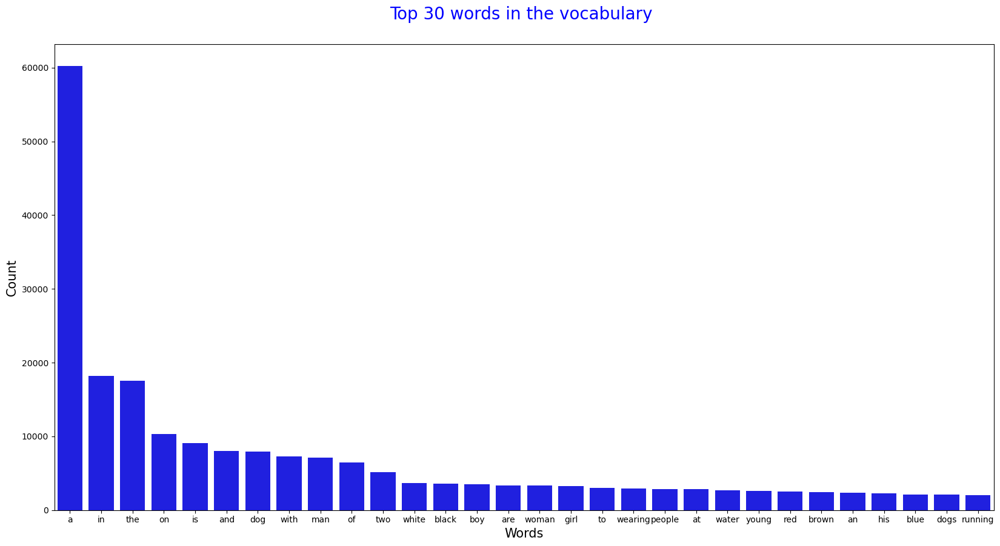

In [15]:
# Visualize the top 30 most common words in captions without filtering stopwords

for word,count in val_count.most_common(30) :
    print(word, ':', count)
    
lst = val_count.most_common(30)
most_common_word_df = pd.DataFrame( lst, columns= ['word','count'] )
plt.figure(figsize=(20,10))
sns.barplot(x = 'word', y = 'count', data = most_common_word_df, color = 'Blue')
plt.title('Top 30 words in the vocabulary \n', color = 'b', size = 20)
plt.xlabel('Words', size = 15)
plt.ylabel('Count', size = 15)

#### Observation:- 
The word "a" is the most frequently occurring word in the captions, followed by common stopwords like "in" and "the." This indicates that the captions are descriptive, with frequent use of articles and prepositions.

### Visualizing Word Frequencies Using a Word Cloud

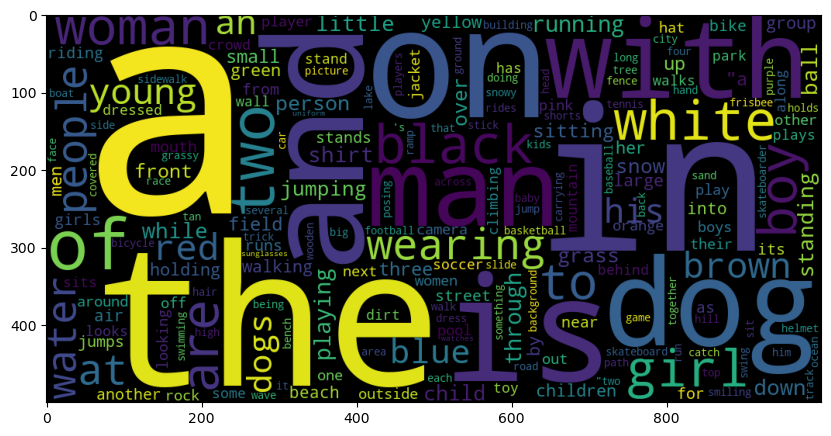

In [16]:
wordcloud = WordCloud(width = 1000, height = 500).generate_from_frequencies(val_count)
plt.figure(figsize=(10,10))
plt.imshow(wordcloud)
plt.show()

#### Observation:- 
We can see that stopwords are having higher frequency.
The word cloud highlights that the most frequent words in the dataset include generic terms like "the," "a," and "on," along with descriptive terms such as "dog," "woman," and "boy," indicating the dataset heavily focuses on people, animals, and actions.

dog :  7948
man :  7137
two :  5132
white :  3706
black :  3620
boy :  3514
woman :  3304
girl :  3277
wearing :  2916
people :  2811
water :  2676
young :  2587
red :  2553
brown :  2457
blue :  2125
dogs :  2095
running :  1996
playing :  1954
little :  1736
shirt :  1735
standing :  1702
ball :  1678
grass :  1565
person :  1515
child :  1507
snow :  1439
jumping :  1430
front :  1322
sitting :  1322
small :  1257


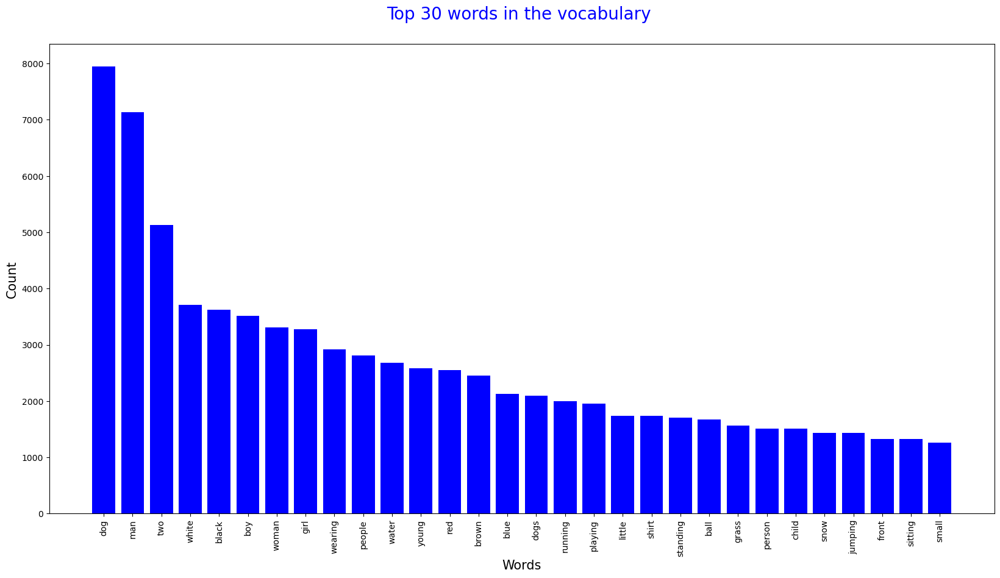

In [17]:
# Visualize the top words in captions after removing stopwords (filtered up to 47 words)

for word, count in val_count.most_common(47):
    if word not in STOPWORDS:
        print(word, ": ", count)
        
dict_without_stopwords = {}
for word, count in val_count.most_common(47):
    if word not in STOPWORDS:
        dict_without_stopwords[word] = count
plt.figure(figsize = (20,10))        
plt.bar(range(len(dict_without_stopwords)), dict_without_stopwords.values(), align = 'center', color = 'Blue')
plt.xticks(range(len(dict_without_stopwords)), list(dict_without_stopwords.keys()))
plt.title(f'Top {len(dict_without_stopwords)} words in the vocabulary \n', color='b', size=20)
plt.xlabel('Words', size = 15)
plt.ylabel('Count', size = 15)
plt.xticks(rotation = 90)
plt.show()


#### Observation:-
The most frequent non-stopwords in the captions include <start>, <end>, and descriptive terms like "dog," "man," and "two," indicating a focus on structured captioning and prominent objects or entities in the images.

### Visualizing Word Frequencies Using a Word Cloud

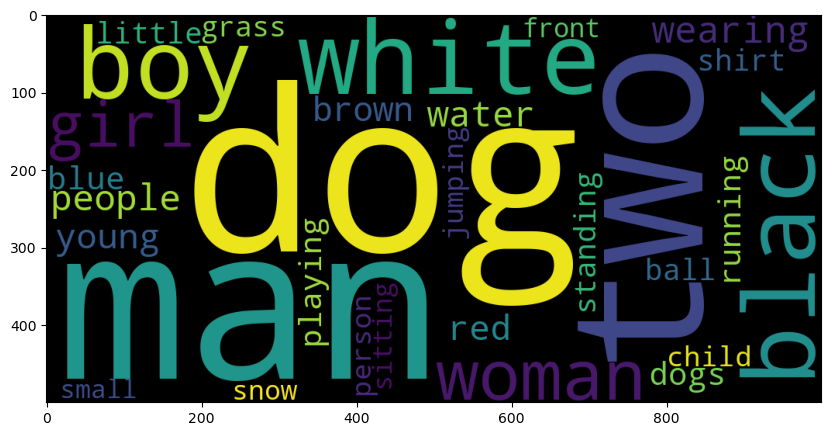

In [18]:
wordcloud = WordCloud(width = 1000, height = 500).generate_from_frequencies(dict_without_stopwords)
plt.figure(figsize = (10,10))
plt.imshow(wordcloud)
plt.show()

#### Observation :-
The word cloud shows that "dog," "man," and "two" are the most frequently used words, indicating the dataset contains many images featuring dogs, people, and pairs of objects or subjects.

### Distribution of Caption Word Counts with Mean Highlighted

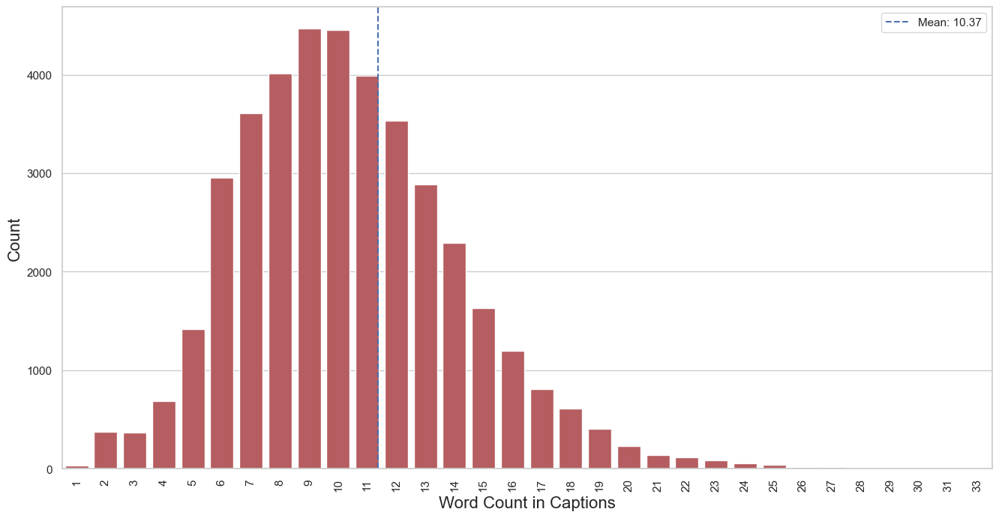

In [19]:
caption_df = df.copy()
caption_df['caption_word_count'] = caption_df["Captions"].str.split().str.len()
caption_df['caption_word_count'] = caption_df['caption_word_count'].astype(int)
caption_df = caption_df.sort_values('caption_word_count')

# Calculate the mean word count
mean = caption_df['caption_word_count'].mean()

# Prepare the data for plotting
counts = caption_df['caption_word_count'].value_counts().sort_index()

# Plot the data using sns.barplot
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="whitegrid", font_scale=1)
plt.figure(figsize=(16, 8))
sns.barplot(x=counts.index, y=counts.values, color="r")

# Add labels and mean line
plt.xlabel('Word Count in Captions', fontsize=16)
plt.ylabel('Count', fontsize=16)
plt.axvline(mean, color='b', linestyle='--', label=f'Mean: {mean:.2f}')
plt.legend()
plt.xticks(rotation=90)

# Show the plot
plt.show()


#### Observation :-
The majority of captions have a word count around the mean of 10.37, with a normal-like distribution, peaking between 8 to 12 words.

### Distribution of Caption Word Counts with Median Highlighted

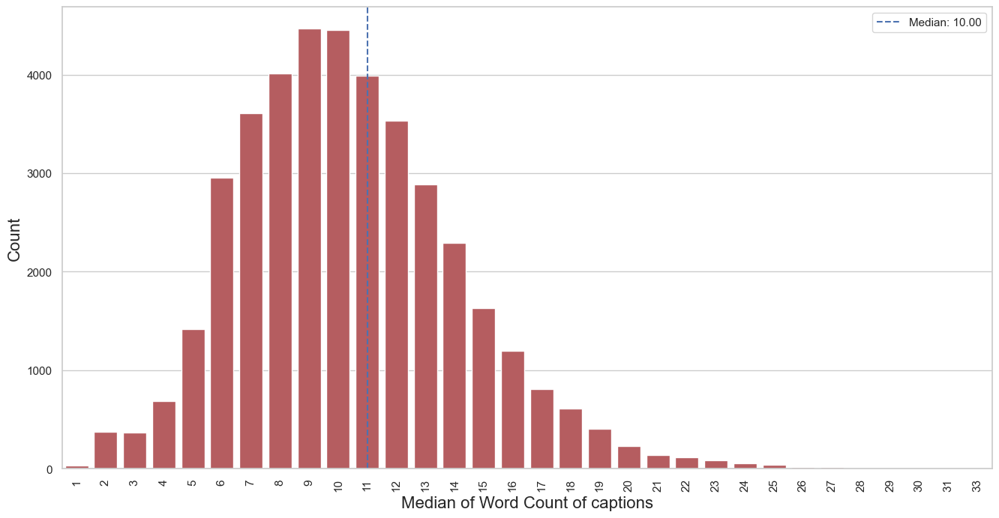

In [20]:
# Calculate the median word count
mean = np.median(caption_df['caption_word_count'])

caption_df['caption_word_count'] = caption_df['caption_word_count'].astype(int)
caption_df = caption_df.sort_values('caption_word_count')

# Prepare the data for plotting
counts = caption_df['caption_word_count'].value_counts().sort_index()

# Plot the data using sns.barplot
sns.set(style='whitegrid', font_scale=1)
plt.figure(figsize=(16, 8))
sns.barplot(x=counts.index, y=counts.values, color='r')

# Add labels and median line
plt.xlabel('Median of Word Count of captions', fontsize=16)
plt.ylabel('Count', fontsize=16)
plt.axvline(mean, color='b', linestyle='--', label=f'Median: {mean:.2f}')
plt.legend()
plt.xticks(rotation=90)

# Show the plot
plt.show()


#### Observation :- 
Most captions have around 10 words, with shorter and longer captions gradually less frequent.

### Visualizing both images & captions together

In [21]:
# Function to display images with their corresponding captions

def plot_image_captions(Pathlist, captionsList, fig, count = 2, npix = 299, nimg = 2):
    image_load = load_img(Path, target_size = (npix, npix, 3))
    ax = fig.add_subplot(nimg, 2, count, xticks = [], yticks = [])
    ax.imshow(image_load)
    
    count += 1
    ax = fig.add_subplot(nimg, 2, count)
    plt.axis('off')
    ax.plot()
    ax.set_xlim(0,1)
    ax.set_ylim(0, len(captions))
    for i, caption in enumerate(captions):
        ax.text(0,i,caption,fontsize = 20)

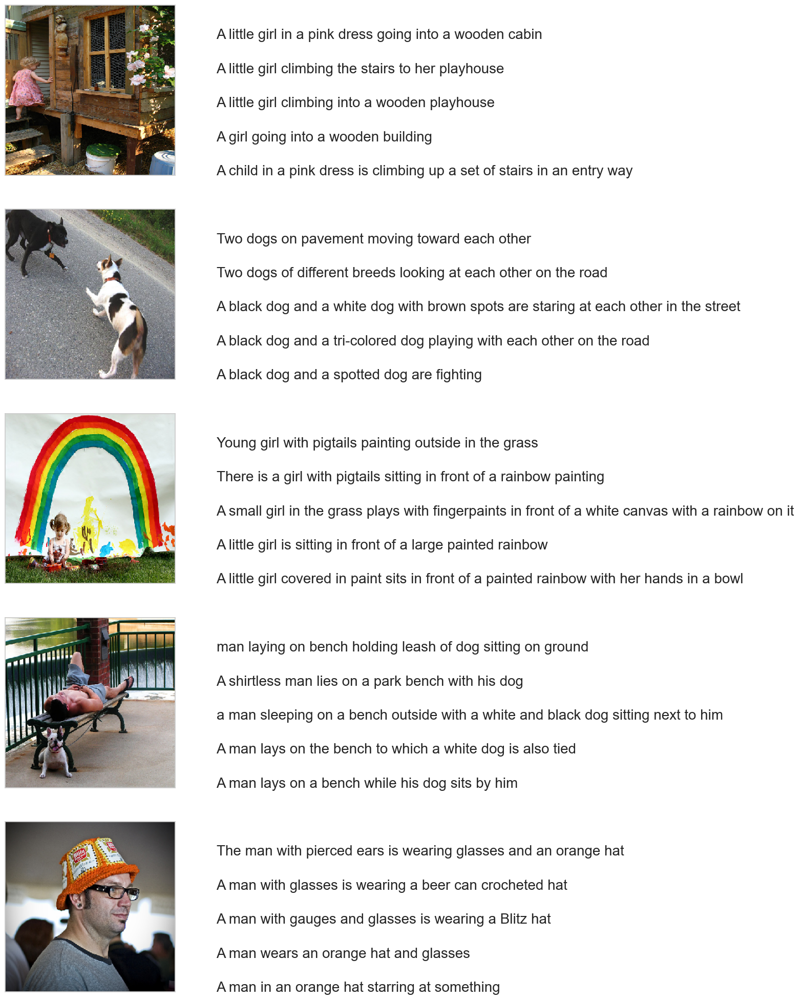

In [22]:
# For displaying image

fig = plt.figure(figsize = (10,25)) 
count = 1

for Path in df[:25].Path.unique():
    captions = list(df['Captions'].loc[df.Path== Path].values)
    plot_image_captions(Path,captions,fig,count,299,5)
    count += 2
plt.show()

# Data Cleaning

- Converting all words to lower case
- Removing punctuations
- Retaining only words by removing numbers
- We are not removing stopwords but removing hanging s, a or any one letter word.
- We are not performing stemming

In [23]:
# Data Cleaning
# Prepare translation table for removing punctuation
remove_punctuation = str.maketrans('', '', string.punctuation)
for i in range(len(annotations)):
    line = annotations[i]
    line = line.split()
    line = [word.lower() for word in line]
    line = [word.translate(remove_punctuation) for word in line]
    line = [word for word in line if len(word)>1]
    line = [word for word in line if word.isalpha()]
    annotations[i] = ' '.join(line)

In [24]:
#Create a list which contains all the captions
#Add the <start> & <end> token to all those captions as well
annotations = ['<start>' + ' ' + line + ' ' + '<end>' for line in annotations]

#Create a list which contains all the path to the images
all_img_path = all_img_vector

#check total captions and images present in dataset
print('Total captions present in the dataset: '+str(len(annotations)))
print('Total images present in the dataset: '+str(len(all_img_path)))

Total captions present in the dataset: 40455
Total images present in the dataset: 40455


In [25]:
annotations[0:5]

['<start> child in pink dress is climbing up set of stairs in an entry way <end>',
 '<start> girl going into wooden building <end>',
 '<start> little girl climbing into wooden playhouse <end>',
 '<start> little girl climbing the stairs to her playhouse <end>',
 '<start> little girl in pink dress going into wooden cabin <end>']

In [26]:
#Create the vocabulary & the counter for the captions

vocabulary = [ word.lower() for line in annotations for word in line.split() ]

val_count = collections.Counter(vocabulary)
val_count

Counter({'<start>': 40455,
         '<end>': 40455,
         'in': 18182,
         'the': 17676,
         'on': 10367,
         'is': 9069,
         'and': 8057,
         'dog': 7956,
         'with': 7308,
         'man': 7164,
         'of': 6496,
         'two': 5546,
         'white': 3710,
         'black': 3627,
         'boy': 3534,
         'are': 3365,
         'woman': 3320,
         'girl': 3284,
         'to': 3005,
         'wearing': 2917,
         'people': 2837,
         'at': 2819,
         'water': 2676,
         'young': 2610,
         'red': 2553,
         'brown': 2471,
         'an': 2358,
         'his': 2255,
         'blue': 2125,
         'dogs': 2097,
         'running': 1996,
         'through': 1979,
         'playing': 1954,
         'while': 1818,
         'down': 1755,
         'little': 1750,
         'shirt': 1735,
         'standing': 1703,
         'ball': 1678,
         'grass': 1565,
         'person': 1521,
         'child': 1517,
         'snow':

## [2.a] Pre-Processing the captions
1.Create the tokenized vectors by tokenizing the captions fore ex :split them using spaces & other filters. 
This gives us a vocabulary of all of the unique words in the data. Keep the total vocaublary to top 5,000 words for saving memory.

2.Replace all other words with the unknown token "UNK" .

3.Create word-to-index and index-to-word mappings.

4.Pad all sequences to be the same length as the longest one.

In [27]:
# create the tokenizer

top_voc = 5000

tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words = top_voc+1, filters = '!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ',
                                                 lower = True, char_level = False, oov_token = 'UNK')
tokenizer.fit_on_texts(annotations)

train_seqs = tokenizer.texts_to_sequences(annotations)

In [28]:
# Create word-to-index and index-to-word mappings.

tokenizer.word_index['PAD'] = 0
tokenizer.index_word[0] = 'PAD'

In [29]:
print(tokenizer.oov_token)
print(tokenizer.index_word[0])

UNK
PAD


In [30]:
tokenizer.index_word

{1: 'UNK',
 2: '<start>',
 3: '<end>',
 4: 'in',
 5: 'the',
 6: 'on',
 7: 'is',
 8: 'and',
 9: 'dog',
 10: 'with',
 11: 'man',
 12: 'of',
 13: 'two',
 14: 'white',
 15: 'black',
 16: 'boy',
 17: 'are',
 18: 'woman',
 19: 'girl',
 20: 'to',
 21: 'wearing',
 22: 'people',
 23: 'at',
 24: 'water',
 25: 'young',
 26: 'red',
 27: 'brown',
 28: 'an',
 29: 'his',
 30: 'blue',
 31: 'dogs',
 32: 'running',
 33: 'through',
 34: 'playing',
 35: 'while',
 36: 'down',
 37: 'little',
 38: 'shirt',
 39: 'standing',
 40: 'ball',
 41: 'grass',
 42: 'person',
 43: 'child',
 44: 'snow',
 45: 'jumping',
 46: 'over',
 47: 'three',
 48: 'front',
 49: 'sitting',
 50: 'small',
 51: 'field',
 52: 'up',
 53: 'holding',
 54: 'large',
 55: 'group',
 56: 'by',
 57: 'green',
 58: 'yellow',
 59: 'children',
 60: 'walking',
 61: 'men',
 62: 'her',
 63: 'into',
 64: 'beach',
 65: 'air',
 66: 'near',
 67: 'jumps',
 68: 'mouth',
 69: 'street',
 70: 'runs',
 71: 'for',
 72: 'another',
 73: 'riding',
 74: 'from',
 75: 'it

In [31]:
tokenizer.word_counts

OrderedDict([('<start>', 40455),
             ('child', 1517),
             ('in', 18182),
             ('pink', 702),
             ('dress', 332),
             ('is', 9069),
             ('climbing', 490),
             ('up', 1215),
             ('set', 105),
             ('of', 6496),
             ('stairs', 109),
             ('an', 2358),
             ('entry', 1),
             ('way', 48),
             ('<end>', 40455),
             ('girl', 3284),
             ('going', 145),
             ('into', 1046),
             ('wooden', 278),
             ('building', 485),
             ('little', 1750),
             ('playhouse', 6),
             ('the', 17676),
             ('to', 3005),
             ('her', 1102),
             ('cabin', 4),
             ('black', 3627),
             ('dog', 7956),
             ('and', 8057),
             ('spotted', 36),
             ('are', 3365),
             ('fighting', 130),
             ('tricolored', 12),
             ('playing', 1954),
        

In [32]:
train_seqs[:5] #First 5 instance

[[2, 43, 4, 88, 169, 7, 115, 52, 390, 12, 382, 4, 28, 1, 687, 3],
 [2, 19, 309, 63, 193, 119, 3],
 [2, 37, 19, 115, 63, 193, 2354, 3],
 [2, 37, 19, 115, 5, 382, 20, 62, 2354, 3],
 [2, 37, 19, 4, 88, 169, 309, 63, 193, 2889, 3]]

In [33]:
annotations[:5]

['<start> child in pink dress is climbing up set of stairs in an entry way <end>',
 '<start> girl going into wooden building <end>',
 '<start> little girl climbing into wooden playhouse <end>',
 '<start> little girl climbing the stairs to her playhouse <end>',
 '<start> little girl in pink dress going into wooden cabin <end>']

In [34]:
print(len(train_seqs))
print(type(train_seqs))

40455
<class 'list'>


<start> :  40455
<end> :  40455
in :  18182
the :  17676
on :  10367
is :  9069
and :  8057
dog :  7956
with :  7308
man :  7164
of :  6496
two :  5546
white :  3710
black :  3627
boy :  3534
are :  3365
woman :  3320
girl :  3284
to :  3005
wearing :  2917
people :  2837
at :  2819
water :  2676
young :  2610
red :  2553
brown :  2471
an :  2358
his :  2255
blue :  2125
dogs :  2097


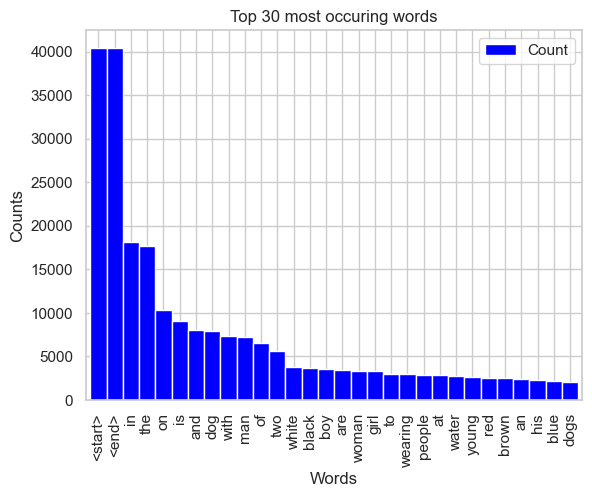

In [35]:
# Create a word count of your tokenizer to visulize the Top 30 occuring words after text processing

tokenizer_top_words = [word.lower() for line in annotations for word in line.split()]
tokenizer_top_words_count = collections.Counter(tokenizer_top_words)
tokenizer_top_words_count

for word, count in tokenizer_top_words_count.most_common(30):
    print(word, ': ', count)
    
token_lst = tokenizer_top_words_count.most_common(30)
most_common_words_df = pd.DataFrame(token_lst, columns = ['Word', 'Count'])
most_common_words_df.plot.bar(x = 'Word', y = 'Count', width = 1, color='blue')
plt.title('Top 30 most occuring words')
plt.xlabel('Words')
plt.ylabel('Counts')
plt.grid(True)


#### Observation :-
The plot shows that frequently used tokens like <start> and <end> dominate the dataset, followed by common words such as "a," "in," and "the," which indicates a strong presence of structural elements and prepositions in the captions.

#### Visualizing Word Frequencies Using a Word Cloud

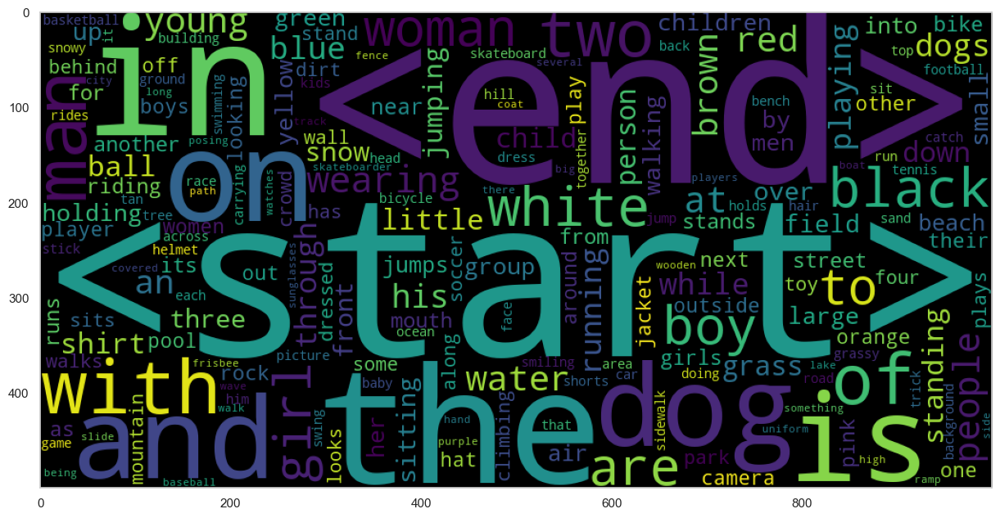

In [36]:
wordcloud_token = WordCloud(width = 1000, height = 500).generate_from_frequencies(tokenizer_top_words_count)
plt.figure(figsize = (15,10))
plt.imshow(wordcloud_token)
plt.grid()

#### Observation :-
The word cloud indicates the presence of special tokens like `<start>` and `<end>`, which dominate the visualization. These should ideally be filtered out for better insights into the actual content of the captions.

### Padding Sequences to Uniform Length and Preparing for Masking

In [37]:
# Pad each vector to the max_length of the captions ^ store it to a vairable

train_seqs_len = [len(seq) for seq in train_seqs]
longest_word_length = max(train_seqs_len)

# Calculate the longest_word_length to pad all sequences to be the same length as the longest one.

cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding = 'post', maxlen = longest_word_length,
                                                          dtype = 'int32', value = 0)

print('The shape of Caption vector is: ' + str(cap_vector.shape))

The shape of Caption vector is: (40455, 31)


**We pad sequences at the end (padding='post') to preserve the structure, as the start token expects meaningful words to follow. Since zeros can disrupt embeddings, masking will be applied to ignore padded values during computations.**

## [2.b] Pre-processing the images

1.Resize them into the shape of (299, 299)

2.Convert images to a format suitable for processing

3.Normalize the image within the range of -1 to 1, such that it is in correct format for InceptionV3. 

### FAQs on how to resize the images::
* Since you have a list which contains all the image path, you need to first convert them to a dataset using <i>tf.data.Dataset.from_tensor_slices</i>. Once you have created a dataset consisting of image paths, you need to apply a function to the dataset which will apply the necessary preprocessing to each image. 
* This function should resize them and also should do the necessary preprocessing that it is in correct format for InceptionV3.


In [38]:
# Checking to know about image format 
# as we will be setting data format as none in tf.keras.applications.inception_v3.preprocess_input

tf.keras.backend.image_data_format()

'channels_last'

**The default image data format, 'channels_last,' represents images as a 3D array where the last dimension corresponds to color channels (e.g., `[rows][cols][channels]`).**

In [39]:
IMAGE_SHAPE = (299, 299)

In [40]:
# Write you code here
# Let's see how preprocessed image looks by preprocessing first 5 images alone.

preprocessed_img = []
for img in all_imgs[0:5]:
    img = tf.io.read_file(img, name=None)
    #by defaulting channels = 0 which indicates to use the number of channels in the JPEG- encoded image.
    img = tf.image.decode_jpeg(img, channels=0)
    img = tf.image.resize(img, IMAGE_SHAPE)
    img = tf.keras.applications.inception_v3.preprocess_input(img, data_format=None) # Defaunt value for data_format is None
    # It refers to global setting tf.keras.backend.image_data_format()
    preprocessed_img.append(img)

Shape after resize:  (299, 299, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape after resize:  (299, 299, 3)
Shape after resize:  (299, 299, 3)
Shape after resize:  (299, 299, 3)
Shape after resize:  (299, 299, 3)


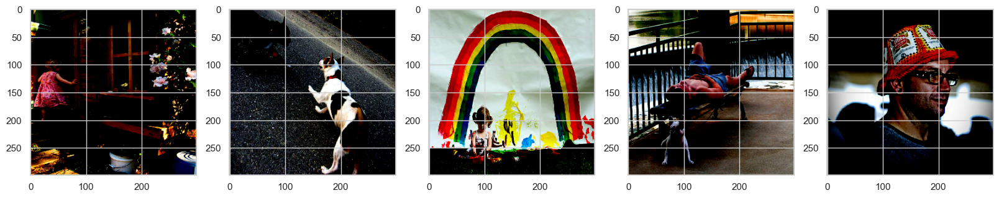

In [41]:
# Display the first 5 preprocessed images with their resized shapes

Display_Images = preprocessed_img[0:5]
figure, axes = plt.subplots(1,5)
figure.set_figwidth(20)

for ax, image in zip(axes, Display_Images):
    print('Shape after resize: ', image.shape)
    ax.imshow(image)
    ax.grid('off')

### Let's write a function for preprocessing and return images and it's path so that we can use concept of vectorization and preprocess images paralleley rather than writing for loop

In [42]:
#write your code here for creating the function. This function should return images & their path

# write your code here
def preprocess_images_function(image_path):
    img = tf.io.read_file(image_path, name=None)
    #by defaulting channels = 0 which indicates to use the number of channels in the JPEG- encoded image.
    img = tf.image.decode_jpeg(img, channels=0)
    img = tf.image.resize(img, IMAGE_SHAPE)
    img = tf.keras.applications.inception_v3.preprocess_input(img, data_format=None) # Defaunt value for data_format is None
    # It refers to global setting tf.keras.backend.image_data_format()
    return img, image_path

## [3] Create the train & test data

1.Combine both images & captions to create the train & test dataset using tf.data.Dataset.API. Create the train-test split using 80-20 ratio & random state = 42

2.Make sure you have done Shuffle and batch while building the dataset

3.The shape of each image in the dataset after building should be (batch_size, 299, 299, 3)

4.The shape of each caption in the dataset after building should be(batch_size, max_len)

In [43]:
all_img_vector

['./Images/1000268201_693b08cb0e.jpg',
 './Images/1000268201_693b08cb0e.jpg',
 './Images/1000268201_693b08cb0e.jpg',
 './Images/1000268201_693b08cb0e.jpg',
 './Images/1000268201_693b08cb0e.jpg',
 './Images/1001773457_577c3a7d70.jpg',
 './Images/1001773457_577c3a7d70.jpg',
 './Images/1001773457_577c3a7d70.jpg',
 './Images/1001773457_577c3a7d70.jpg',
 './Images/1001773457_577c3a7d70.jpg',
 './Images/1002674143_1b742ab4b8.jpg',
 './Images/1002674143_1b742ab4b8.jpg',
 './Images/1002674143_1b742ab4b8.jpg',
 './Images/1002674143_1b742ab4b8.jpg',
 './Images/1002674143_1b742ab4b8.jpg',
 './Images/1003163366_44323f5815.jpg',
 './Images/1003163366_44323f5815.jpg',
 './Images/1003163366_44323f5815.jpg',
 './Images/1003163366_44323f5815.jpg',
 './Images/1003163366_44323f5815.jpg',
 './Images/1007129816_e794419615.jpg',
 './Images/1007129816_e794419615.jpg',
 './Images/1007129816_e794419615.jpg',
 './Images/1007129816_e794419615.jpg',
 './Images/1007129816_e794419615.jpg',
 './Images/1007320043_627

In [44]:
# Write your code here
# Mapping each image full path including name to the function to preprocess the image

# sorting and storing unique path in list which will be gien as input
training_list = sorted(set(all_img_vector))

# Creating a Dataset using tf.data.Dataset.from_tensor_slice
New_Image_Data = tf.data.Dataset.from_tensor_slices(training_list)

# Mapping preprocess_image_function across the elements of the above dataset
# num_parallel_calls = tf.data.AUTOTUNE is used, then the number of parallel calls is set dynamically
New_Image_Data = New_Image_Data.map(preprocess_images_function, num_parallel_calls = tf.data.experimental.AUTOTUNE)

# Keeping batch size = 64 (64 consecutive elements of this dataset is combined in a single batch).
# We don't want to drop the last batch if it contains element less than 64. So, let's set drop_remainder = False
New_Image_Data = New_Image_Data.batch(64, drop_remainder = False)

In [45]:
New_Image_Data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 299, 299, None), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.string, name=None))>

In [46]:
#write your code here
# performing the train-test split using 80-20 ratio and random state = 42

img_train_data, img_test_data, caption_train_data, caption_test_data = train_test_split(all_img_vector, cap_vector, test_size = 0.2, random_state = 42)

In [47]:
print('No. of images in training dataset: ', len(img_train_data))
img_train_data[0:5]

No. of images in training dataset:  32364


['./Images/359082432_c1fd5aa2d6.jpg',
 './Images/2460799229_ce45a1d940.jpg',
 './Images/3634828052_3b6aeda7d6.jpg',
 './Images/2216568822_84c295c3b0.jpg',
 './Images/3080056515_3013830309.jpg']

In [48]:
print('No. of images in testing dataset: ', len(img_test_data))
img_test_data[0:5]

No. of images in testing dataset:  8091


['./Images/2973269132_252bfd0160.jpg',
 './Images/270263570_3160f360d3.jpg',
 './Images/2053006423_6adf69ca67.jpg',
 './Images/512101751_05a6d93e19.jpg',
 './Images/3156406419_38fbd52007.jpg']

In [49]:
print('No. of captions in training dataset: ', len(caption_train_data))
caption_train_data[0:5]

No. of captions in training dataset:  32364


array([[   2,   11,    8,    9,   17,   39,    6,  146,  148,  110,  542,
          46,   20,    5,  170,    3,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0],
       [   2,    5,   47,   95,  238,   17,   21,  472,  543,   17,   90,
          63,    5,   24,    3,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0],
       [   2,   18,   10,   94,   10,  283,  195, 2640,  278,  140,    3,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0],
       [   2,   18,   10,   26, 2236,  168,    8, 1869,  455, 1056,    6,
          62,  325,    3,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0],
       [   2,   80,   42,    7, 3255,   20,   72,    3,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
        

In [50]:
print('No. of images in testing dataset: ', len(caption_test_data))
caption_test_data[0:5]

No. of images in testing dataset:  8091


array([[   2,   54, 1626,  588,    7, 4556,  223,  121, 1476,    3,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0],
       [   2,   13,   27,   31,  500,    6,    5, 1681,  170,    3,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0],
       [   2,   11,    4,  164,    7,   39,    6,   82,   90,   87,   23,
           5,  458,   74,    5, 3975,    3,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0],
       [   2,  887,   14,    9,    7,   32,    6,    5,   41,    3,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0],
       [   2,   42,  376,  727,    3,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
        

## Load the pretrained Imagenet weights of Inception net V3

1.To save the memory(RAM) from getting exhausted, extract the features of the images using the last layer of pre-trained model. Including this as part of training will lead to higher computational time.

2.The shape of the output of this layer is 8x8x2048. 

3.Use a function to extract the features of each image in the train & test dataset such that the shape of each image should be (batch_size, 8*8, 2048)



In [51]:
# Build a feature extraction model using InceptionV3 without the top layer

image_model = tf.keras.applications.InceptionV3(include_top=False,weights='imagenet')

new_input = image_model.input #write code here to get the input of the image_model
hidden_layer = image_model.layers[-1].output #write code here to get the output of the image_model

image_features_extract_model = tf.compat.v1.keras.Model(new_input, hidden_layer)#build the final model using both input & output layer

In [52]:
# write the code to apply the feature_extraction model to your earlier created dataset which contained images & their respective paths
# Once the features are created, you need to reshape them such that feature shape is in order of (batch_size, 8*8, 2048)

image_features_extract_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, None,      │        864 │ input_layer[0][0] │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, None,      │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, None,      │      9,216 │ activation[0][0]  │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, None,      │     18,432 │ activation_1[0][… │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, None,      │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, None,      │      5,120 │ max_pooling2d[0]… │
│                     │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, None,      │    138,240 │ activation_3[0][… │
│                     │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, None,      │          0 │ batch_normalizat

 Total params: 21,802,784 (83.17 MB)

 Trainable params: 21,768,352 (83.04 MB)

 Non-trainable params: 34,432 (134.50 KB)

**Note:** We are not classifying the images here, there is no need to have the softmax layer at the end.

### Extracting features from each image in the dataset

In [53]:
# We are using tqdm for progress bar
image_features_dict={}
for image, image_path in tqdm(New_Image_Data):
    features_for_batch = image_features_extract_model(image) # feed images from newly created Dataset above to Inception V3 built above.
    features_for_batch_flattened = tf.reshape(features_for_batch,
                                              (features_for_batch.shape[0], -1, features_for_batch.shape[3])) # Features in a batch
    
    for batch_feat, path in zip(features_for_batch_flattened, image_path):
        feature_path = path.numpy().decode('utf-8')
        image_features_dict[feature_path] = batch_feat.numpy()

100%|██████████| 127/127 [08:21<00:00,  3.95s/it]


In [54]:
features_for_batch

<tf.Tensor: shape=(27, 8, 8, 2048), dtype=float32, numpy=
array([[[[0.00000000e+00, 7.74663836e-02, 0.00000000e+00, ...,
          2.31838077e-01, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          1.07788712e-01, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 1.94035292e-01, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 1.85754851e-01],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          9.42659974e-02, 0.00000000e+00, 5.05791128e-01],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

        [[0.00000000e+00, 4.23005849e-01, 1.34433582e-02, ...,
          2.33669728e-01, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         

In [55]:
features_for_batch_flattened

<tf.Tensor: shape=(27, 64, 2048), dtype=float32, numpy=
array([[[0.0000000e+00, 7.7466384e-02, 0.0000000e+00, ...,
         2.3183808e-01, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         1.0778871e-01, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 1.9403529e-01, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 1.8575485e-01],
        ...,
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 1.6569393e+00, 0.0000000e+00],
        [0.0000000e+00, 4.0262374e-01, 0.0000000e+00, ...,
         0.0000000e+00, 3.1792116e-01, 0.0000000e+00],
        [0.0000000e+00, 2.5347636e+00, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],

       [[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         1.2506061e+00, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 7.8492068e-02, ...,
         1.2064261e+00, 0.0000000e+00, 0.0000000e+00],
        [0.000000

In [56]:
len(image_features_dict)

8091

In [57]:
batch_feat.shape

TensorShape([64, 2048])

In [58]:
import more_itertools
top_5_items = more_itertools.take(5, image_features_dict.items())

top_5_items 

[('./Images/1000268201_693b08cb0e.jpg',
  array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
          0.        ],
         [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
          0.16987127],
         [0.        , 0.        , 1.0105938 , ..., 0.        , 0.        ,
          0.061119  ],
         ...,
         [0.        , 0.        , 2.0380404 , ..., 1.202971  , 0.        ,
          1.992406  ],
         [0.        , 0.        , 0.9046855 , ..., 0.        , 0.        ,
          0.        ],
         [0.        , 1.2527266 , 0.        , ..., 0.        , 0.        ,
          0.        ]], dtype=float32)),
 ('./Images/1001773457_577c3a7d70.jpg',
  array([[0.        , 0.66368055, 0.46285474, ..., 0.        , 0.        ,
          3.3322632 ],
         [0.        , 1.2268183 , 0.        , ..., 0.        , 0.25390363,
          3.3295355 ],
         [1.2881938 , 1.5195427 , 0.        , ..., 0.46778113, 0.36474702,
          3.8172605 ],
      

In [59]:
# We need to give both images and caption to model as input
def model_input(image, captions):
    image_final = image_features_dict[image.decode('utf-8')]
    return image_final, captions

In [60]:
# Buffer size to shuffle the dataset
# (TF data is designed to work with possibly infinite sequences)
# so it doesn't attempt to shuffle the entire sequence in memory. Instead,
# it maintains a buffer in which it shuffles elements).

BUFFER_SIZE = 1000

# Batch size
BATCH_SIZE = 64 #tried with different batch sizes. kernel is dying for 32. So, finally fixed 64.

def data_generator(images_data, captions_data):
    
    # Creating a Dataset using tf.data.Dataset.from_tensor_slice
    dataset = tf.data.Dataset.from_tensor_slices((images_data, captions_data))
    
    dataset = dataset.map(lambda item1, item2: tf.numpy_function(model_input, [item1, item2], [tf.float32, tf.int32]),
                         num_parallel_calls = tf.data.experimental.AUTOTUNE)
    
    dataset = (
    dataset.shuffle(BUFFER_SIZE, reshuffle_each_iteration=True)
    .batch(BATCH_SIZE, drop_remainder=False)
    .prefetch(tf.data.experimental.AUTOTUNE)
    )
    
    return dataset

In [61]:
train_dataset = data_generator(img_train_data, caption_train_data)
test_dataset = data_generator(img_test_data, caption_test_data)

In [62]:
sample_img_batch, sample_cap_batch = next(iter(train_dataset))
print(sample_img_batch.shape)
print(sample_cap_batch.shape)

(64, 64, 2048)
(64, 31)


## [4] Model Building
1.Set the parameters

2.Build the Encoder, Attention model & Decoder

In [63]:
# Define model parameters and dataset configurations for training

embedding_dim = 256 
units = 512
vocab_size = 5001 #top 5,000 words +1
train_num_steps = len(img_train_data)//BATCH_SIZE #len(total train images) // BATCH_SIZE
test_num_steps = len(img_test_data)//BATCH_SIZE #len(total test images) // BATCH_SIZE
max_length = 31
features_shape = batch_feat.shape[1]
attention_features_shape = batch_feat.shape[0]

In [64]:
train_num_steps

505

In [65]:
test_num_steps

126

### Encoder

In [66]:
tf.compat.v1.reset_default_graph() #to resolve compatibility issue

In [67]:
print(tf.compat.v1.get_default_graph())

In [68]:
# Define the CNN Encoder to extract and transform image features

class Encoder(Model):
    def __init__(self,embed_dim):
        super(Encoder, self).__init__()
        self.dense = tf.keras.layers.Dense(embed_dim) #build your Dense layer with relu activation
        
    def call(self, features):
        features = self.dense(features) # extract the features from the image shape: (batch, 8*8, embed_dim)
        features = tf.keras.activations.relu(features, max_value=None, threshold=0)
        return features

In [69]:
encoder=Encoder(embedding_dim)

In [70]:
encoder

<Encoder name=encoder, built=False>

### Attention model

Attention acts as a bridge between the encoder and decoder, enabling the decoder to access information from all encoder hidden states. This mechanism allows the model to selectively focus on important parts of the input sequence and learn associations effectively.

The attention model generates a context vector, which is passed to the decoder for predicting the word at each timestamp. This vector is adaptive, changing with each timestamp, which enhances the model's speed and prediction accuracy.

In [71]:
# Define the Attention model to focus on relevant image regions

class Attention_model(Model):
    def __init__(self, units):
        super(Attention_model, self).__init__()
        self.W1 = tf.keras.layers.Dense(units) #build your Dense layer
        self.W2 = tf.keras.layers.Dense(units) #build your Dense layer
        self.V = tf.keras.layers.Dense(1) #build your final Dense layer with unit 1
        self.units=units

    def call(self, features, hidden):
        #features shape: (batch_size, 8*8, embedding_dim)
        # hidden shape: (batch_size, hidden_size)
        hidden_with_time_axis = hidden[:, tf.newaxis]  # Expand the hidden shape to shape: (batch_size, 1, hidden_size)
        score = tf.keras.activations.tanh(self.W1(features) + self.W2(hidden_with_time_axis)) # build your score funciton to shape: (batch_size, 8*8, units)
        attention_weights = tf.keras.activations.softmax(self.V(score), axis = 1)  # extract your attention weights with shape: (batch_size, 8*8, 1)
        context_vector = attention_weights * features  #shape: create the context vector with shape (batch_size, 8*8,embedding_dim)
        context_vector = tf.reduce_sum(context_vector, axis = 1) # reduce the shape to (batch_size, embedding_dim)
        

        return context_vector, attention_weights

**Notes:**
    
1. Attention model does a linear transformation of input. tanh on top of attention model introduces non-linearities and helps in achieving a smoother distribution.
2. The features produced from fully connected dense layer of encoder and the hidden state of decoder are fed to tanh function and attention score is calculated.
3. As we require an output in range(0,1) we will apply softmax function to attention score and get the final attention weights.

### Decoder

In [72]:
# Define the RNN Decoder with Attention to generate captions

class Decoder(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder, self).__init__()
        self.units=units
        self.attention = Attention_model(self.units) #iniitalise your Attention model with units
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim) #build your Embedding layer
        self.gru = tf.keras.layers.GRU(self.units,return_sequences=True,return_state=True,recurrent_initializer='glorot_uniform')
        self.d1 = tf.keras.layers.Dense(self.units) #build your Dense layer
        self.d2 = tf.keras.layers.Dense(vocab_size) #build your Dense layer
        

    def call(self,x,features, hidden):
        context_vector, attention_weights = self.attention(features, hidden) #create your context vector & attention weights from attention model
        embed = self.embed(x) # embed your input to shape: (batch_size, 1, embedding_dim)
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis = -1) # Concatenate your input with the context vector from attention layer. Shape: (batch_size, 1, embedding_dim + embedding_dim)
        output,state = self.gru(embed) # Extract the output & hidden state from GRU layer. Output shape : (batch_size, max_length, hidden_size)
        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2])) # shape : (batch_size * max_length, hidden_size)
        output = self.d2(output) # shape : (batch_size * max_length, vocab_size)
        
        return output,state, attention_weights
    
    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [73]:
# Initialize the Decoder with embedding dimensions, units, and vocabulary size

decoder=Decoder(embedding_dim, units, vocab_size)

In [74]:
# Generate predictions, hidden states, and attention weights using the Encoder-Decoder model

features=encoder(sample_img_batch)

hidden = decoder.init_state(batch_size=sample_cap_batch.shape[0])
dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * sample_cap_batch.shape[0], 1)

predictions, hidden_out, attention_weights= decoder(dec_input, features, hidden)
print('Feature shape from Encoder: {}'.format(features.shape)) #(batch, 8*8, embed_dim)
print('Predcitions shape from Decoder: {}'.format(predictions.shape)) #(batch,vocab_size)
print('Attention weights shape from Decoder: {}'.format(attention_weights.shape)) #(batch, 8*8, embed_dim)

Feature shape from Encoder: (64, 64, 256)
Predcitions shape from Decoder: (64, 5001)
Attention weights shape from Decoder: (64, 64, 1)


### Model training & optimization
1.Set the optimizer & loss object

2.Create your checkpoint path

3.Create your training & testing step functions

4.Create your loss function for the test dataset

In [75]:
# Define the optimizer

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)  
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)

In [76]:
# Define the loss function with masking to ignore padding tokens

def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask

    return tf.reduce_mean(loss_)

In [77]:
# Set up checkpointing to save and manage model state during training

checkpoint_path = "./checkpoint1"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [78]:
# Restore the latest checkpoint and set the starting epoch

start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

* While creating the training step for your model, you will apply Teacher forcing.
* Teacher forcing is a technique where the target/real word is passed as the next input to the decoder instead of previous prediciton.

In [79]:
# Define the training step to compute loss, gradients, and update model weights

@tf.function
def train_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size=target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    
    with tf.GradientTape() as tape:
        encoder_output = encoder(img_tensor)
        for t in range(1, target.shape[1]):
            predictions, hidden, _ =decoder(dec_input, encoder_output, hidden)
            loss += loss_function(target[:,t], predictions)
            dec_input = tf.expand_dims(target[:,t], 1)
    avg_loss = (loss/int(target.shape[1]))
    tot_trainables_variables = encoder.trainable_variables + decoder.trainable_variables
    gradients = tape.gradient(loss, tot_trainables_variables)
    optimizer.apply_gradients(zip(gradients, tot_trainables_variables))
        
    return loss, avg_loss

* While creating the test step for your model, you will pass your previous prediciton as the next input to the decoder.

In [80]:
# Define the testing step to evaluate model performance and compute loss

@tf.function
def test_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size=target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    
    with tf.GradientTape() as tape:
        encoder_output = encoder(img_tensor)
        
        for t in range(1, target.shape[1]):
            predictions, hidden, _ =decoder(dec_input, encoder_output, hidden)
            loss += loss_function(target[:,t], predictions)
            dec_input = tf.expand_dims(target[:,t], 1)
            
    avg_loss = (loss/int(target.shape[1]))
        
    tot_trainables_variables = encoder.trainable_variables + decoder.trainable_variables
    gradients = tape.gradient(loss, tot_trainables_variables)
    optimizer.apply_gradients(zip(gradients, tot_trainables_variables))
    #write your code here to do the testing steps
        
    return loss, avg_loss

In [81]:
# Calculate the average test loss over the entire test dataset

def test_loss_cal(test_dataset):
    total_loss = 0
    
    for (batch, (img_tensor, target)) in enumerate(test_dataset):
        batch_loss, t_loss = test_step(img_tensor, target)
        total_loss += t_loss
    avg_test_loss = total_loss/test_num_steps

    #write your code to get the average loss result on your test data
    
    return avg_test_loss

In [83]:
# Train the model for multiple epochs, track losses, and save the best checkpoint

loss_plot = []
test_loss_plot = []
EPOCHS = 15

best_test_loss=100
for epoch in tqdm(range(0, EPOCHS)):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(train_dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss
        avg_train_loss=total_loss / train_num_steps
        
    loss_plot.append(avg_train_loss)    
    test_loss = test_loss_cal(test_dataset)
    test_loss_plot.append(test_loss)
    
    print ('For epoch: {}, the train loss is {:.3f}, & test loss is {:.3f}'.format(epoch+1,avg_train_loss,test_loss))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
    
    if test_loss < best_test_loss:
        print('Test loss has been reduced from %.3f to %.3f' % (best_test_loss, test_loss))
        best_test_loss = test_loss
        ckpt_manager.save()

  0%|          | 0/15 [00:00<?, ?it/s]

For epoch: 1, the train loss is 0.971, & test loss is 0.974
Time taken for 1 epoch 1352.7027151584625 sec

Test loss has been reduced from 100.000 to 0.974


  7%|▋         | 1/15 [22:34<5:16:03, 1354.55s/it]

For epoch: 2, the train loss is 0.913, & test loss is 0.908
Time taken for 1 epoch 1351.9144763946533 sec

Test loss has been reduced from 0.974 to 0.908


 13%|█▎        | 2/15 [45:08<4:53:23, 1354.15s/it]

For epoch: 3, the train loss is 0.861, & test loss is 0.856
Time taken for 1 epoch 1354.4383058547974 sec

Test loss has been reduced from 0.908 to 0.856


 20%|██        | 3/15 [1:07:44<4:31:01, 1355.09s/it]

For epoch: 4, the train loss is 0.814, & test loss is 0.810
Time taken for 1 epoch 1357.104510307312 sec

Test loss has been reduced from 0.856 to 0.810


 27%|██▋       | 4/15 [1:30:23<4:08:42, 1356.60s/it]

For epoch: 5, the train loss is 0.771, & test loss is 0.765
Time taken for 1 epoch 1356.1228182315826 sec

Test loss has been reduced from 0.810 to 0.765


 33%|███▎      | 5/15 [1:53:03<3:46:17, 1357.70s/it]

For epoch: 6, the train loss is 0.732, & test loss is 0.727
Time taken for 1 epoch 1356.6086003780365 sec

Test loss has been reduced from 0.765 to 0.727


 40%|████      | 6/15 [2:15:41<3:23:41, 1357.94s/it]

For epoch: 7, the train loss is 0.695, & test loss is 0.691
Time taken for 1 epoch 1360.8393955230713 sec

Test loss has been reduced from 0.727 to 0.691


 47%|████▋     | 7/15 [2:38:24<3:01:16, 1359.52s/it]

For epoch: 8, the train loss is 0.661, & test loss is 0.658
Time taken for 1 epoch 1356.7994992733002 sec

Test loss has been reduced from 0.691 to 0.658


 53%|█████▎    | 8/15 [3:01:01<2:38:31, 1358.74s/it]

For epoch: 9, the train loss is 0.631, & test loss is 0.625
Time taken for 1 epoch 1361.4218003749847 sec

Test loss has been reduced from 0.658 to 0.625


 60%|██████    | 9/15 [3:23:44<2:16:00, 1360.11s/it]

For epoch: 10, the train loss is 0.600, & test loss is 0.596
Time taken for 1 epoch 1362.2701032161713 sec

Test loss has been reduced from 0.625 to 0.596


 67%|██████▋   | 10/15 [3:46:27<1:53:24, 1360.84s/it]

For epoch: 11, the train loss is 0.573, & test loss is 0.571
Time taken for 1 epoch 1360.4468874931335 sec

Test loss has been reduced from 0.596 to 0.571


 73%|███████▎  | 11/15 [4:09:07<1:30:43, 1360.79s/it]

For epoch: 12, the train loss is 0.548, & test loss is 0.546
Time taken for 1 epoch 1356.2934725284576 sec

Test loss has been reduced from 0.571 to 0.546


 80%|████████  | 12/15 [4:31:44<1:07:58, 1359.50s/it]

For epoch: 13, the train loss is 0.525, & test loss is 0.523
Time taken for 1 epoch 1363.3556380271912 sec

Test loss has been reduced from 0.546 to 0.523


 87%|████████▋ | 13/15 [4:54:27<45:21, 1360.73s/it]  

For epoch: 14, the train loss is 0.503, & test loss is 0.504
Time taken for 1 epoch 1358.4703867435455 sec

Test loss has been reduced from 0.523 to 0.504


 93%|█████████▎| 14/15 [5:17:06<22:40, 1360.13s/it]

For epoch: 15, the train loss is 0.484, & test loss is 0.483
Time taken for 1 epoch 1358.8333570957184 sec

Test loss has been reduced from 0.504 to 0.483


100%|██████████| 15/15 [5:39:45<00:00, 1359.04s/it]


#### Observations :-

- The train and test losses steadily decrease over the epochs, showing that the model is learning and improving.
- The test loss drops significantly from 1.193 in the first epoch to 0.526 by the 15th epoch, indicating better performance with each iteration.
- There’s no sign of overfitting, as the test loss consistently improves along with the train loss.
- Each epoch takes considerable time, ranging from 22 to 47 minutes, highlighting the computational intensity of the process.

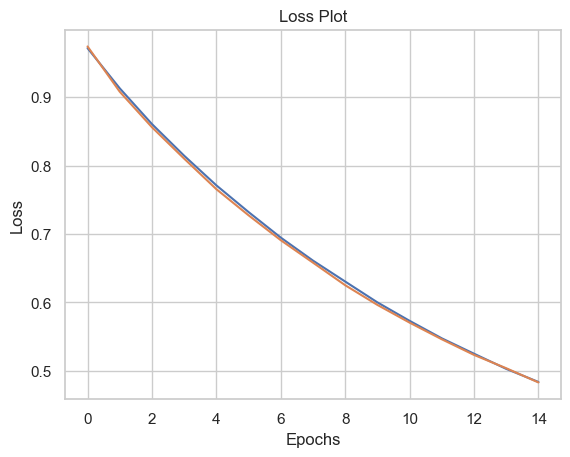

In [98]:
# Plot the training and testing loss over epochs

plt.plot(loss_plot)
plt.plot(test_loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

#### NOTE: 
- Both training and test losses decrease steadily across epochs, indicating that the model is effectively learning patterns from the data.
- The close alignment of training and test loss curves suggests minimal overfitting, meaning the model performs well on unseen data.
- The loss values begin to plateau in later epochs, implying the model is nearing optimal performance under the current training setup.

## [5] Model Evaluation
1.Define your evaluation function using greedy search

2.Define your evaluation function using beam search ( optional)

3.Test it on a sample data using BLEU score

### Greedy Search

In [85]:
# Evaluate an image to generate a caption and attention plot

def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.init_state(batch_size=1)

    temp_input = tf.expand_dims(preprocess_images_function(image)[0], 0) #process the input image to desired format before extracting features
    img_tensor_val = image_features_extract_model(temp_input) # Extract features using our feature extraction model
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val) # extract the features by passing the input to encoder

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden) # get the output from decoder

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy() #extract the predicted id(embedded value) which carries the max value
        result.append(tokenizer.index_word[predicted_id]) #map the id to the word from tokenizer and append the value to the result list

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot,predictions

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot,predictions


### Beam Search(optional)

In [86]:
# Plot the attention map over the image for each word in the caption

def plot_attmap(caption, weights, image):

    fig = plt.figure(figsize=(10, 10))
    temp_img = np.array(Image.open(image))
    
    len_cap = len(caption)
    for cap in range(len_cap):
        weights_img = np.reshape(weights[cap], (8,8))
        weights_img = np.array(Image.fromarray(weights_img).resize((224, 224), Image.LANCZOS))
        
        ax = fig.add_subplot(len_cap//2, len_cap//2, cap+1)
        ax.set_title(caption[cap], fontsize=15)
        
        img=ax.imshow(temp_img)
        
        ax.imshow(weights_img, cmap='gist_heat', alpha=0.6,extent=img.get_extent())
        ax.axis('off')
    plt.subplots_adjust(hspace=0.2, wspace=0.2)
    plt.show()

### BLEU Score

In [87]:
from nltk.translate.bleu_score import sentence_bleu

In [88]:
# Filter out special tokens like <start>, <unk>, and <end> from the text

def filt_text(text):
    filt=['<start>','<unk>','<end>'] 
    temp= text.split()
    [temp.remove(j) for k in filt for j in temp if k==j]
    text=' '.join(temp)
    return text

In [89]:
img_test = img_test_data.copy()

In [90]:
#modifying the given code as function to run it several times by changing weights

def predicted_caption_audio(random, autoplay=False, weights=(0.5, 0.5 , 0, 0)):
    cap_test = caption_test_data.copy()
    rid = np.random.randint(0, random)
    test_image = img_test[rid]
    #test_image = './images/413231421_43833a11f5.jpg'
    #real_caption = '<start> black dog is digging in the snow <end>'

    real_caption = ' '.join([tokenizer.index_word[i] for i in cap_test[rid] if i not in [0]])
    result, attention_plot,pred_test = evaluate(test_image)


    real_caption=filt_text(real_caption)      


    pred_caption=' '.join(result).rsplit(' ', 1)[0]

    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = pred_caption.split()

    score = sentence_bleu(reference, candidate, weights= weights) #set your weights)
    print(f"BELU score: {score*100}")

    print ('Real Caption:', real_caption)
    print ('Prediction Caption:', pred_caption)
    plot_attmap(result, attention_plot, test_image)


    #Let's use google text to speech online API from playing the predicted caption as audio
    speech = gTTS('Predicted Caption is: '+ pred_caption, lang = 'en', slow = False)
    speech.save('voice.mp3')
    audio_file = 'voice.mp3'
    display.display(display.Audio(audio_file, rate=None, autoplay=autoplay))
    
    return test_image

BELU score: 31.62277660168379
Real Caption: two brown dogs fight on the leafy ground
Prediction Caption: two brown and white dogs are playing in wooded area


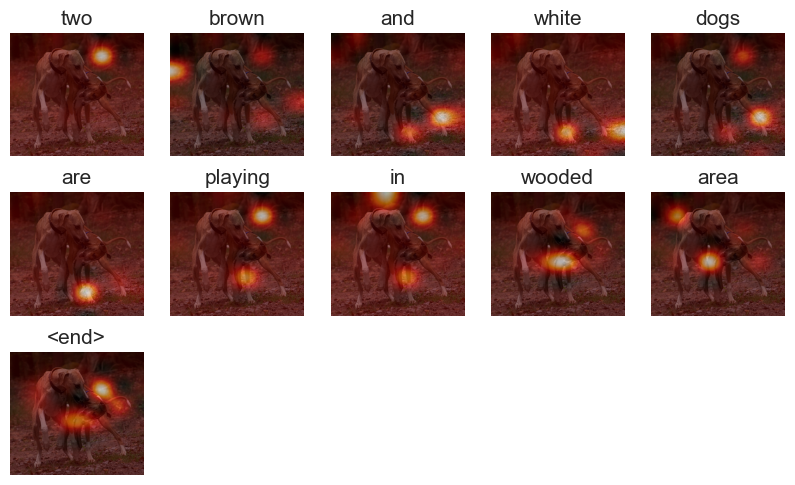

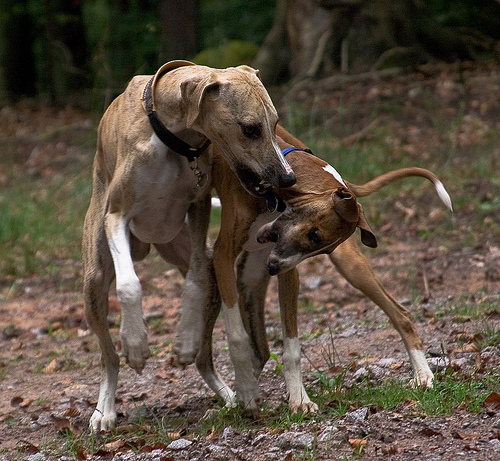

In [91]:
# Generate and display the predicted caption audio for a test image

test_image = predicted_caption_audio(5, True, weights=(0.5,0.25,0,0))
Image.open(test_image)

BELU score: 57.73502691896258
Real Caption: two dogs are fighting over plastic bag
Prediction Caption: two dogs are fighting over wooden structure on wooden floor


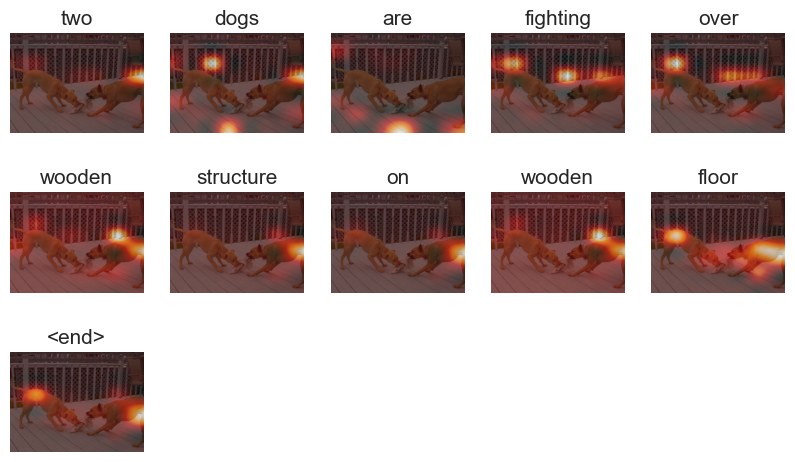

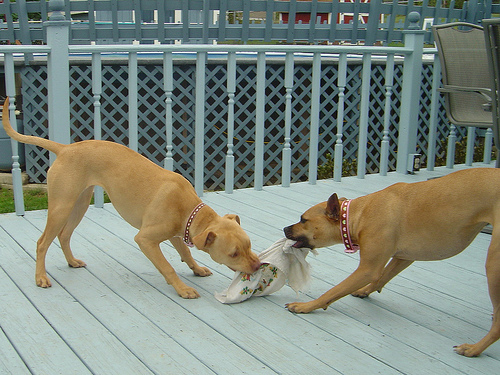

In [96]:
# Generate and display the predicted caption audio for a test image

test_image = predicted_caption_audio(len(img_test), False, weights=(0.5,0.25,0,0))
Image.open(test_image)

BELU score: 4.7645966337577e-76
Real Caption: girl laying on the tree with boy kneeling before her
Prediction Caption: man and woman sit on tree


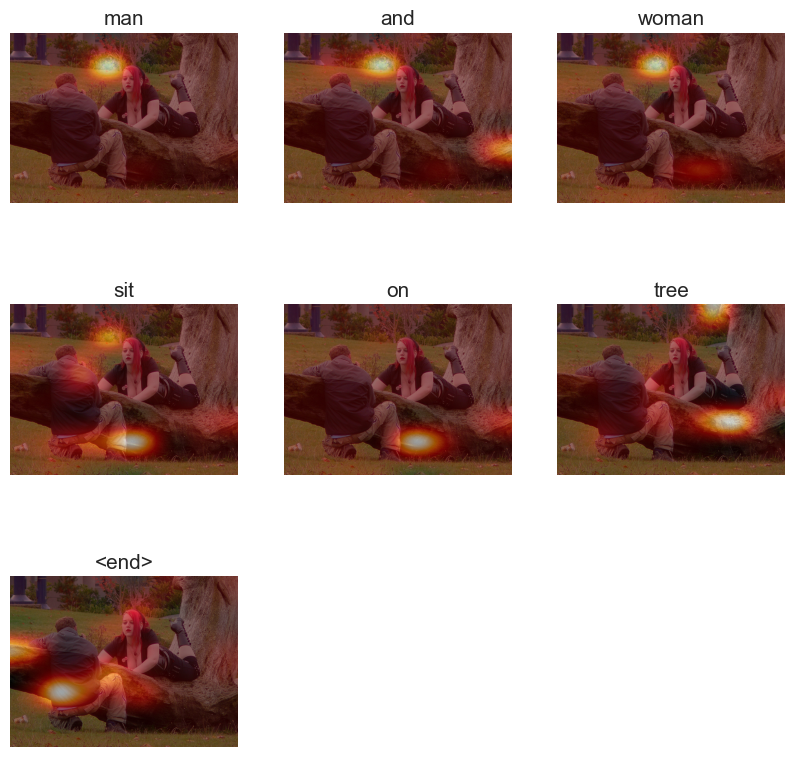

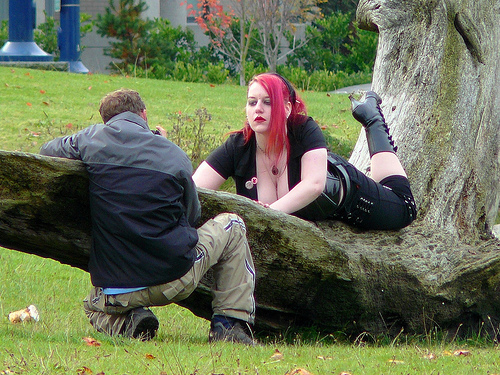

In [97]:
# Generate and display the predicted caption audio for a test image

test_image = predicted_caption_audio(len(img_test), False, weights=(0.25,0.25,0,0))
Image.open(test_image)

BELU score: 64.93358309501978
Real Caption: young blonde girl stands on beach
Prediction Caption: young girl stands on cloudy day


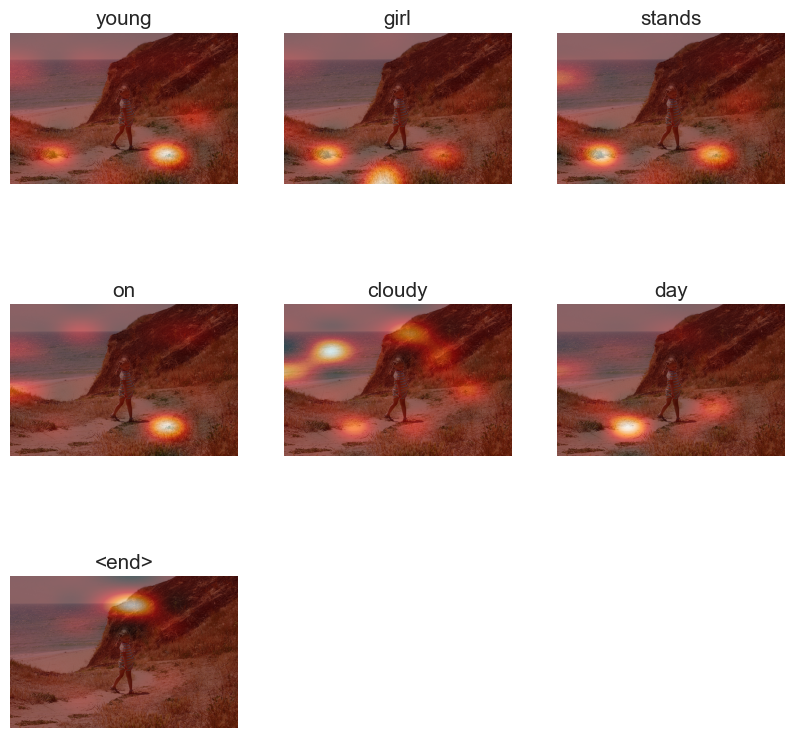

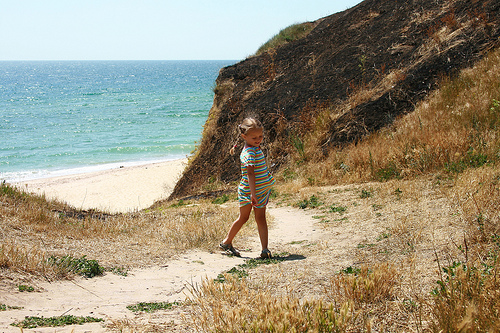

In [94]:
# Generate and display the predicted caption audio for a test image

test_image = predicted_caption_audio(len(img_test), False, weights=(0.5,0.25,0,0))
Image.open(test_image)

In [1]:
# Generate and display the predicted caption audio for a test image

test_image = predicted_caption_audio(len(img_test), False, weights=(0.5,0.5,0,0))
Image.open(test_image)

NameError: name 'predicted_caption_audio' is not defined

### Key Points About My Predictions on Unseen Data

1. I am testing the model on completely new images that it hasn’t seen during training. This ensures the results are unbiased and reflect how well the model works in real-world scenarios.

2. For each test, I randomly select an image from the test dataset. This keeps the process fair and unpredictable.

3. The model generates a caption for the selected image, trying to describe it in words.

4. To evaluate how accurate the prediction is, I compare the generated caption with the actual caption using the BLEU score. This tells me how close the prediction is to the real caption.

5. I clean up the captions by removing unwanted tokens like `<start>` and `<end>` to make the text more readable and meaningful.

6. To make things more interactive, I also convert the predicted caption into speech. This way, I can hear what the model predicted.

7. Finally, I display the attention map to see which parts of the image the model focused on while making its prediction. This helps understand how the model “thinks.”

# PROJECT SUMMARY


The project begins by reading images and captions, performing exploratory data analysis (EDA) to understand the dataset, and cleaning the captions file for better processing.

**Data Preprocessing included:-**
- Tokenizing captions and generating embedded vectors.
- Preprocessing images to standardize their format.
- Splitting the dataset into training and testing sets for evaluation.

**Feature Extraction:-** We used the InceptionV3 model, a high-performing image recognition model with over 78% accuracy on ImageNet, to extract feature vectors from images. The softmax layer was removed, focusing on feature extraction rather than classification. The output feature vector (shape: 8×8×2048) was squeezed into a shape of (64, 2048) for further processing.

**CNN Encoder and RNN Decoder:-** The feature vector was passed to a CNN-based encoder with a fully connected layer. This output, along with the hidden state (initialized to zero) and a start token, was fed into the GRU-based RNN decoder.
The decoder leverages an **Attention mechanism**, enabling it to focus on specific image regions while predicting the next word, thereby reducing noise and improving accuracy. The decoder predicts captions word by word, stopping upon predicting the end token.

**Prediction Process:-** Using a **Greedy search approach**, the decoder calculates the probabilities of each word in the vocabulary, selecting the word with the highest probability at each step.

**Evaluation:-** The predicted captions are evaluated using the **BLEU score** (Bilingual Evaluation Understudy), which measures the similarity between predicted captions and ground-truth captions.

### Highlights of the Approach:-
- Effective use of **InceptionV3** for extracting robust feature vectors from images.
- Implementation of an **attention mechanism** to enhance captioning accuracy by focusing on key image regions.
- Use of **teacher forcing** for efficient training and cross-entropy loss calculation to optimize the model.
- **Greedy search decoding** for sequential word prediction with vocabulary probabilities.
- Evaluation using the **BLEU score**, a widely accepted metric in text generation tasks.
